In [1]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm

from matplotlib import gridspec
# from scipy import corrcoef, stats
from scipy import stats
from numpy import corrcoef
from scipy.stats.kde import gaussian_kde
from pytensor import tensor as tt

%config InlineBackend.figure_format = 'retina'
warnings.simplefilter(action="ignore", category=FutureWarning)
RANDOM_SEED = 8927
np.random.seed(286)

/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_2702/2258007878.py:13: DeprecationWarning: Please import `gaussian_kde` from the `scipy.stats` namespace; the `scipy.stats.kde` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.stats.kde import gaussian_kde


In [2]:
az.style.use("arviz-darkgrid")

# Chapter 5 - Some examples of data analysis
## 5.1 Pearson correlation


The Pearson product-moment correlation coefficient, usually denoted r, is a widely used measure of the relationship between two variables. It ranges from −1, indicating a perfect negative linear relationship, to +1, indicating a perfect positive relationship. A value of 0 indicates that there is no linear relationship. Usually the correlation r is reported as a single point estimate, perhaps together with a frequentist significance test.

But, rather than just having a single number to measure the correlation, it would be nice to have a posterior distribution for r, saying how likely each possible level of correlation was. There are frequentist confidence interval methods that try to do this, as well as various analytic Bayesian results based on asymptotic approximations (e.g., Donner & Wells, 1986).


Inferring the mean and variance of a Gaussian distribution. 
$$ \mu_{1},\mu_{2} \sim \text{Gaussian}(0, .001)  $$
$$ \sigma_{1},\sigma_{2} \sim \text{InvSqrtGamma} (.001, .001)  $$
$$ r \sim \text{Uniform} (-1, 1) $$  
$$ x_{i} \sim \text{MvGaussian} ((\mu_{1},\mu_{2}), \begin{bmatrix}\sigma_{1}^2 & r\sigma_{1}\sigma_{2}\\r\sigma_{1}\sigma_{2} & \sigma_{2}^2\end{bmatrix}^{-1})  $$

The observed data take the form _x<sub>i</sub>_ = (_x<sub>i1</sub>_, _x<sub>i2</sub>_) for the ith observation, and, following the theory behind the correlation coefficient, are modeled as draws from a multivariate Gaussian distribution. The parameters of this distribution are the means _μ_ = (_μ<sub>1</sub>_,_μ<sub>2</sub>_) and standard deviations _σ_ = (_σ<sub>1</sub>_,_σ<sub>2</sub>_) of the two variables, and the correlation coefficient _r_ that links them.

**NB: This model runs with PyMC 3.8, but not with the master branch -- probably related to [this issue](https://github.com/pymc-devs/pymc/issues/3884).**

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [r, mu, lambda1, lambda2]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 2 chains for 3_000 tune and 3_000 draw iterations (6_000 + 6_000 draws total) took 85 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


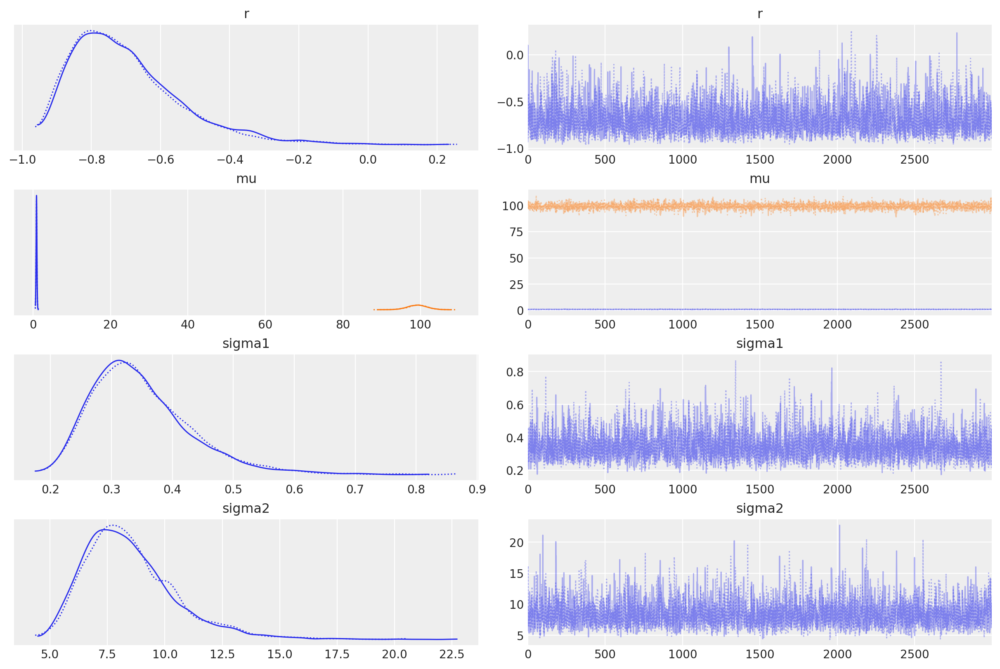

In [24]:
# The datasets:
y = np.array(
    [
        0.8, 102,
        1, 98,
        0.5, 100,
        0.9, 105,
        0.7, 103,
        0.4, 110,
        1.2, 99, 
        1.4, 87,
        0.6, 113,
        1.1, 89,
        1.3, 93,
    ]
).reshape((11, 2))

n_data_points = y.shape[0]

# y = np.array([.8,102, 1,98, .5,100, 0.9,105, .7,103,
#                0.4,110, 1.2,99, 1.4,87, 0.6,113, 1.1,89, 1.3,93,
#                .8,102, 1,98, .5,100, 0.9,105, .7,103,
#                0.4,110, 1.2,99, 1.4,87, 0.6,113, 1.1,89, 1.3,93]).reshape((22, 2))

with pm.Model() as model1:
    #  r∼Uniform(−1,1)
    r = pm.Uniform("r", lower=-1, upper=1)

    # μ1,μ2∼Gaussian(0,.001)
    mu = pm.Normal("mu", mu=0, tau=0.001, shape=2)

    # σ1,σ2∼InvSqrtGamma(.001,.001)
    lambda1 = pm.Gamma("lambda1", alpha=0.001, beta=0.001)
    lambda2 = pm.Gamma("lambda2", alpha=0.001, beta=0.001)
    sigma1 = pm.Deterministic("sigma1", 1 / np.sqrt(lambda1))
    sigma2 = pm.Deterministic("sigma2", 1 / np.sqrt(lambda2))

    cov = pm.Deterministic(
        "cov",
        tt.stacklists(
            [[lambda1 ** -1, r * sigma1 * sigma2], [r * sigma1 * sigma2, lambda2 ** -1]]
        ),
    )

    # xi∼MvGaussian((μ1,μ2),[σ1^2,rσ1σ2;rσ1σ2,σ2^2]^−1)
    yd = pm.MvNormal("yd", mu=mu, cov=cov, observed=y, shape=(n_data_points, 2))

    trace1 = pm.sample(3000, tune=3000, target_accept=.9, chains=2)

az.plot_trace(trace1, var_names=["r", "mu", "sigma1", "sigma2"]);

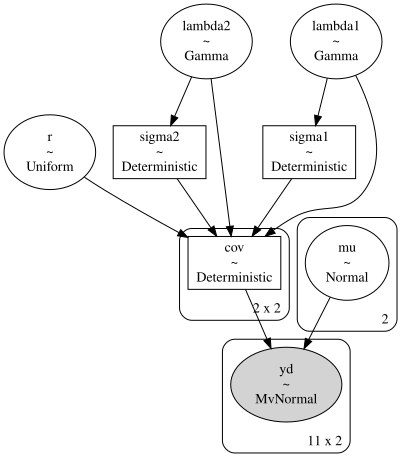

In [25]:
pm.model_to_graphviz(model1)

In [71]:
az.summary(trace1, stat_funcs={"median": np.median})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
mu[0],0.922,0.108,0.715,1.127,0.002,0.002,2695.0,2228.0,1.0,0.920
mu[1],99.201,2.596,94.327,104.173,0.048,0.034,2946.0,2952.0,1.0,99.236
r,-0.697,0.164,-0.944,-0.399,0.003,0.002,2912.0,3632.0,1.0,-0.729
lambda1,9.547,4.201,2.694,17.413,0.073,0.052,3088.0,3408.0,1.0,8.929
lambda2,0.016,0.007,0.005,0.030,0.000,0.000,3164.0,3415.0,1.0,0.015
sigma1,0.349,0.084,0.216,0.506,0.002,0.001,3088.0,3408.0,1.0,0.335
sigma2,8.492,2.052,5.193,12.377,0.038,0.027,3164.0,3415.0,1.0,8.164
"cov[0, 0]",0.129,0.067,0.042,0.248,0.001,0.001,3088.0,3408.0,1.0,0.112
"cov[0, 1]",-2.197,1.323,-4.513,-0.312,0.028,0.020,2517.0,2767.0,1.0,-1.907
"cov[1, 0]",-2.197,1.323,-4.513,-0.312,0.028,0.020,2517.0,2767.0,1.0,-1.907


The r estimation (mean) is -0.697
The r estimation (median) is -0.729
The Pearson correlation r is -0.811


/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_16822/9284371.py:18: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


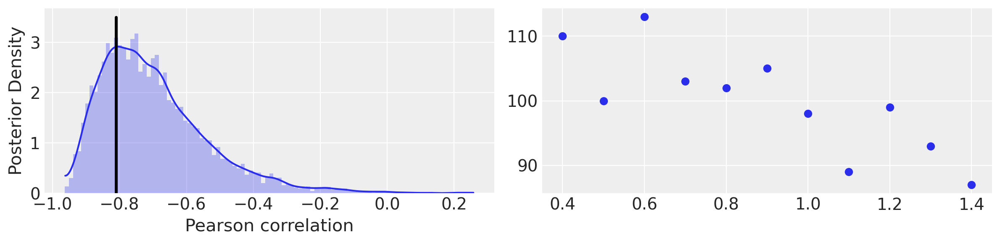

In [27]:
postr = trace1.posterior["r"]
freqr = corrcoef(y[:, 0], y[:, 1])
print("The r estimation (mean) is %.3f" % postr.mean())
print("The r estimation (median) is %.3f" % np.median(postr))
print("The Pearson correlation r is %.3f" % freqr[0, 1])

_, axes = plt.subplots(1, 2, figsize=(12, 3))
az.plot_kde(postr.to_numpy().flatten(), ax=axes[0])
axes[0].hist(postr.to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")
axes[0].plot([freqr[0, 1], freqr[0, 1]], [0, 3.5], "k", lw=2.5)
axes[0].set_xlabel("Pearson correlation")
axes[0].set_ylabel("Posterior Density")

axes[1].scatter(y[:, 0], y[:, 1])

plt.tight_layout();

### Exercises

#### Exercise 5.1.1

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [r, mu, lambda1, lambda2]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 2 chains for 3_000 tune and 3_000 draw iterations (6_000 + 6_000 draws total) took 82 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


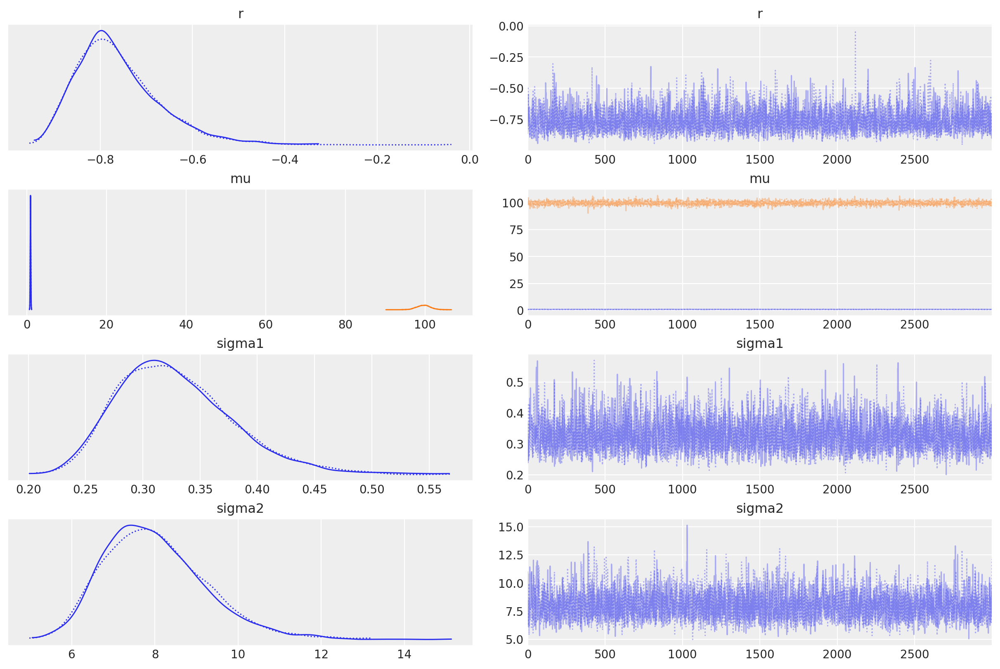

In [28]:
# The datasets:
y_double = np.concatenate([y, y])

n_data_points = y_double.shape[0]

# y = np.array([.8,102, 1,98, .5,100, 0.9,105, .7,103,
#                0.4,110, 1.2,99, 1.4,87, 0.6,113, 1.1,89, 1.3,93,
#                .8,102, 1,98, .5,100, 0.9,105, .7,103,
#                0.4,110, 1.2,99, 1.4,87, 0.6,113, 1.1,89, 1.3,93]).reshape((22, 2))

with pm.Model() as model1_1:
    #  r∼Uniform(−1,1)
    r = pm.Uniform("r", lower=-1, upper=1)

    # μ1,μ2∼Gaussian(0,.001)
    mu = pm.Normal("mu", mu=0, tau=0.001, shape=2)

    # σ1,σ2∼InvSqrtGamma(.001,.001)
    lambda1 = pm.Gamma("lambda1", alpha=0.001, beta=0.001)
    lambda2 = pm.Gamma("lambda2", alpha=0.001, beta=0.001)
    sigma1 = pm.Deterministic("sigma1", 1 / np.sqrt(lambda1))
    sigma2 = pm.Deterministic("sigma2", 1 / np.sqrt(lambda2))

    cov = pm.Deterministic(
        "cov",
        tt.stacklists(
            [[lambda1 ** -1, r * sigma1 * sigma2], [r * sigma1 * sigma2, lambda2 ** -1]]
        ),
    )

    # xi∼MvGaussian((μ1,μ2),[σ1^2,rσ1σ2;rσ1σ2,σ2^2]^−1)
    yd = pm.MvNormal("yd", mu=mu, cov=cov, observed=y_double, shape=(n_data_points, 2))

    trace1_1 = pm.sample(3000, tune=3000, target_accept=.9, chains=2)

az.plot_trace(trace1_1, var_names=["r", "mu", "sigma1", "sigma2"]);

In [29]:
az.summary(trace1_1, stat_funcs={"median": np.median})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
mu[0],0.907,0.071,0.772,1.040,0.001,0.001,3357.0,3660.0,1.0,0.907
mu[1],99.650,1.731,96.613,103.055,0.031,0.022,3221.0,3149.0,1.0,99.661
r,-0.761,0.092,-0.913,-0.594,0.002,0.001,3235.0,3727.0,1.0,-0.777
lambda1,9.893,2.913,4.627,15.179,0.048,0.034,3520.0,3888.0,1.0,9.608
lambda2,0.017,0.005,0.008,0.026,0.000,0.000,3387.0,3350.0,1.0,0.016
sigma1,0.329,0.051,0.241,0.424,0.001,0.001,3520.0,3888.0,1.0,0.323
sigma2,8.008,1.224,5.951,10.363,0.021,0.015,3387.0,3350.0,1.0,7.869
"cov[0, 0]",0.111,0.036,0.055,0.176,0.001,0.000,3520.0,3888.0,1.0,0.104
"cov[0, 1]",-2.063,0.741,-3.415,-0.850,0.014,0.010,2853.0,3304.0,1.0,-1.942
"cov[1, 0]",-2.063,0.741,-3.415,-0.850,0.014,0.010,2853.0,3304.0,1.0,-1.942


The r estimation (mean) is -0.761
The r estimation (median) is -0.777
The Pearson correlation r is -0.811


/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_16822/2170246001.py:18: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


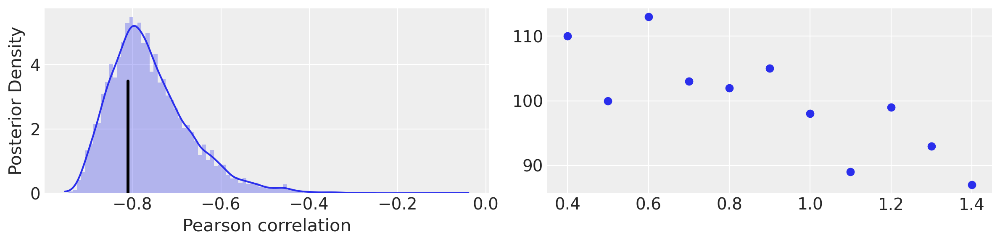

In [30]:
postr1_1 = trace1_1.posterior["r"]
freqr1_1 = corrcoef(y_double[:, 0], y_double[:, 1])
print("The r estimation (mean) is %.3f" % postr1_1.mean())
print("The r estimation (median) is %.3f" % np.median(postr1_1))
print("The Pearson correlation r is %.3f" % freqr1_1[0, 1])

_, axes = plt.subplots(1, 2, figsize=(12, 3))
az.plot_kde(postr1_1.to_numpy().flatten(), ax=axes[0])
axes[0].hist(postr1_1.to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")
axes[0].plot([freqr1_1[0, 1], freqr1_1[0, 1]], [0, 3.5], "k", lw=2.5)
axes[0].set_xlabel("Pearson correlation")
axes[0].set_ylabel("Posterior Density")

axes[1].scatter(y_double[:, 0], y_double[:, 1])

plt.tight_layout();

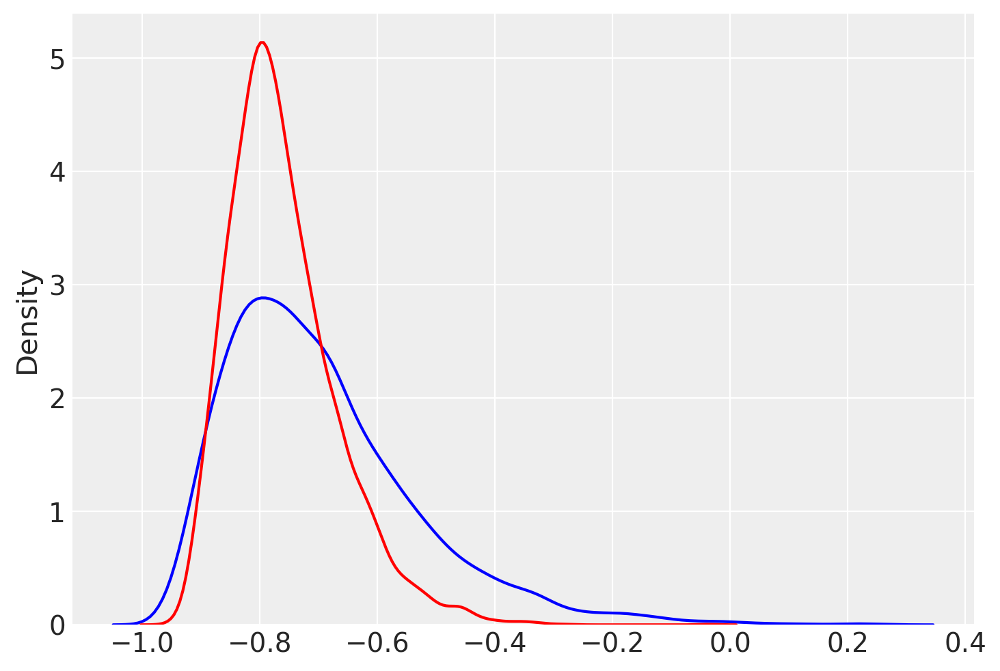

In [41]:
# compare the two posterior distributions for r:
import seaborn as sns
sns.kdeplot(postr.to_numpy().flatten(), label="Single dataset", c="blue")
sns.kdeplot(postr1_1.to_numpy().flatten(), label="Double dataset", c="red")
plt.show()
# az.plot_kde(postr.to_numpy().flatten(), label="Single dataset")
# az.plot_kde(postr1_1.to_numpy().flatten(), label="Double dataset")

So after we duplicate the data, the posterior distribution of r will be more concentrated (around 0.8). Also the point estimate of r (no matter using mean or median) is closer to the r computed from pearson correlation.

#### Exercise 5.1.2

Maybe the prior on $\mu1$ and $\mu2$ is too uninformative. 

~~From the data we can see $\mu1$ should be relatively small and $\mu2$ should be relatively large.~~

Solution for Reference:
>We know that IQ is a positive number with mean 100 and standard deviation 15. We know that response times in semantic veriﬁcation are faster than 0.2 seconds and slower than, say, 5 seconds. This knowledge is at odds with the priors on µ 1 and µ 2 , priors that allow negative values and do not prefer speciﬁc ranges of positive values. Nevertheless, from a practical point of view, the priors for µ 1 and µ 2 are relatively ﬂat across a large range that includes the plausible regions, and hence it is unlikely that more plausible priors aﬀect the inference much.

## 5.2 Pearson correlation with uncertainty

  
$$ \mu_{1},\mu_{2} \sim \text{Gaussian}(0, .001)  $$
$$ \sigma_{1},\sigma_{2} \sim \text{InvSqrtGamma} (.001, .001)  $$
$$ r \sim \text{Uniform} (-1, 1) $$  
$$ y_{i} \sim \text{MvGaussian} ((\mu_{1},\mu_{2}), \begin{bmatrix}\sigma_{1}^2 & r\sigma_{1}\sigma_{2}\\r\sigma_{1}\sigma_{2} & \sigma_{2}^2\end{bmatrix}^{-1})  $$
$$ x_{ij} \sim \text{Gaussian}(y_{ij},\lambda_{j}^e) $$  

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [r, mu, lambda1, lambda2, yd]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 82 seconds.


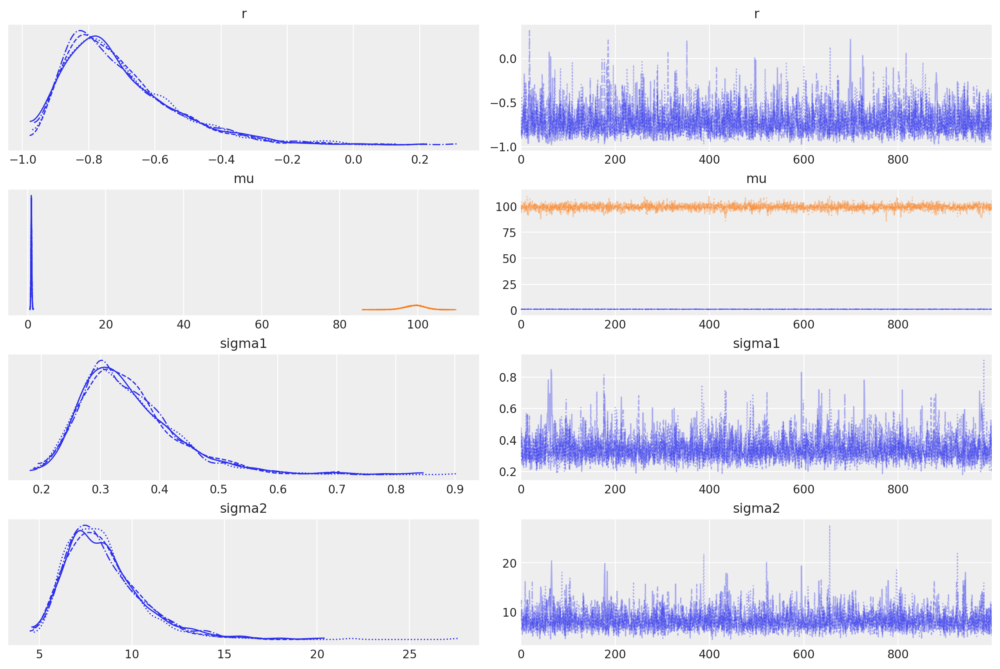

In [44]:
# The datasets:
y = np.array(
    [
        0.8, 102,
        1, 98,
        0.5, 100,
        0.9, 105,
        0.7, 103,
        0.4, 110,
        1.2, 99,
        1.4, 87,
        0.6, 113,
        1.1, 89,
        1.3, 93,
    ]
).reshape((11, 2))

# y = np.array([.8,102, 1,98, .5,100, 0.9,105, .7,103,
#                0.4,110, 1.2,99, 1.4,87, 0.6,113, 1.1,89, 1.3,93,
#                .8,102, 1,98, .5,100, 0.9,105, .7,103,
#                0.4,110, 1.2,99, 1.4,87, 0.6,113, 1.1,89, 1.3,93]).reshape((22, 2))

n1, n2 = np.shape(y)
sigmaerror = np.array([0.03, 1])
se = np.tile(sigmaerror, (n1, 1))

with pm.Model() as model2:
    #  r∼Uniform(−1,1)
    r = pm.Uniform("r", lower=-1, upper=1)

    # μ1,μ2∼Gaussian(0,.001)
    mu = pm.Normal("mu", mu=0, tau=0.001, shape=n2)

    # σ1,σ2∼InvSqrtGamma(.001,.001)
    lambda1 = pm.Gamma("lambda1", alpha=0.001, beta=0.001)
    lambda2 = pm.Gamma("lambda2", alpha=0.001, beta=0.001)
    sigma1 = pm.Deterministic("sigma1", 1 / np.sqrt(lambda1))
    sigma2 = pm.Deterministic("sigma2", 1 / np.sqrt(lambda2))

    cov = pm.Deterministic(
        "cov",
        tt.stacklists(
            [[lambda1 ** -1, r * sigma1 * sigma2], [r * sigma1 * sigma2, lambda2 ** -1]]
        ),
    )

    # xi∼MvGaussian((μ1,μ2),[σ1^2,rσ1σ2;rσ1σ2,σ2^2]^−1)
    yd = pm.MvNormal("yd", mu=mu, cov=cov, shape=(n1, n2))

    xi = pm.Normal("xi", mu=yd, sigma=sigmaerror, observed=y)

    trace2 = pm.sample(tune=2000, target_accept=.9)
    
az.plot_trace(trace2, var_names=["r", "mu", "sigma1", "sigma2"]);

Try to see the model's prediction of the data points.

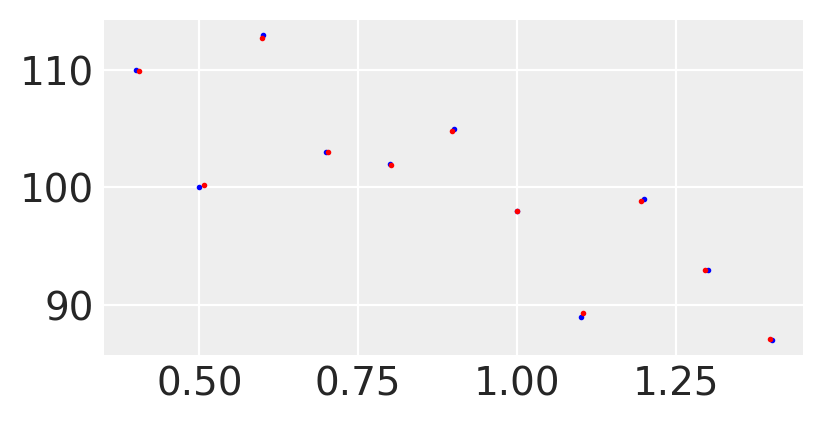

In [67]:
plt.figure(figsize=(4, 2))
plt.scatter(y[:, 0], y[:, 1], s=1, c="blue")
posterior_yd = az.summary(trace2, var_names=["yd"], stat_funcs={"median": np.median})['median'].to_numpy().reshape(11, 2)
plt.scatter(posterior_yd[:, 0], posterior_yd[:, 1], s=1, c="red")

In [70]:
az.summary(trace2, 
           var_names=["r", "mu", "sigma1", "sigma2"],
           stat_funcs={"median": np.median})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
r,-0.707,0.167,-0.936,-0.387,0.003,0.002,3257.0,2737.0,1.0,-0.744
mu[0],0.922,0.110,0.709,1.125,0.002,0.001,3550.0,2336.0,1.0,0.917
mu[1],99.201,2.657,94.104,104.030,0.047,0.033,3381.0,2363.0,1.0,99.297
sigma1,0.347,0.083,0.216,0.502,0.002,0.001,3416.0,2523.0,1.0,0.332
sigma2,8.441,2.106,5.256,12.356,0.037,0.028,4146.0,2585.0,1.0,8.090


The r estimation (mean) is -0.707
The r estimation (median) is -0.744
The Pearson correlation r is -0.811


/var/folders/6y/fdf8wk_52jl4c5d2bnv27j240000gn/T/ipykernel_16822/4044674497.py:18: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


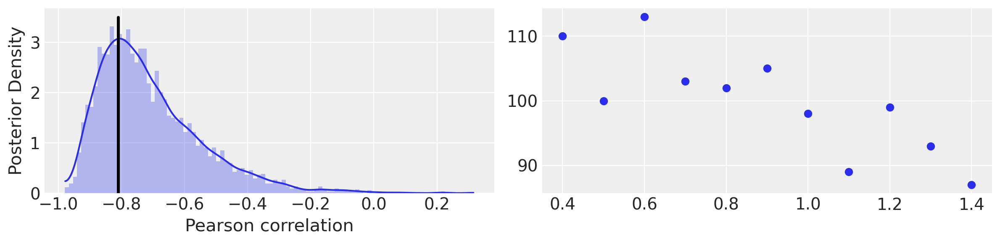

In [75]:
postr = trace2.posterior["r"]
freqr = corrcoef(y[:, 0], y[:, 1])
print("The r estimation (mean) is %.3f" % postr.mean())
print("The r estimation (median) is %.3f" % np.median(postr))
print("The Pearson correlation r is %.3f" % freqr[0, 1])

_, axes = plt.subplots(1, 2, figsize=(12, 3))
az.plot_kde(postr.to_numpy().flatten(), ax=axes[0])
axes[0].hist(postr.to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")
axes[0].plot([freqr[0, 1], freqr[0, 1]], [0, 3.5], "k", lw=2.5)
axes[0].set_xlabel("Pearson correlation")
axes[0].set_ylabel("Posterior Density")

axes[1].scatter(y[:, 0], y[:, 1])

plt.tight_layout();

### Exercises

#### Exercise 5.2.1

By simply comparing the point estimation (mean or median), the latter one gets closer to the pearson correlation coefficient.

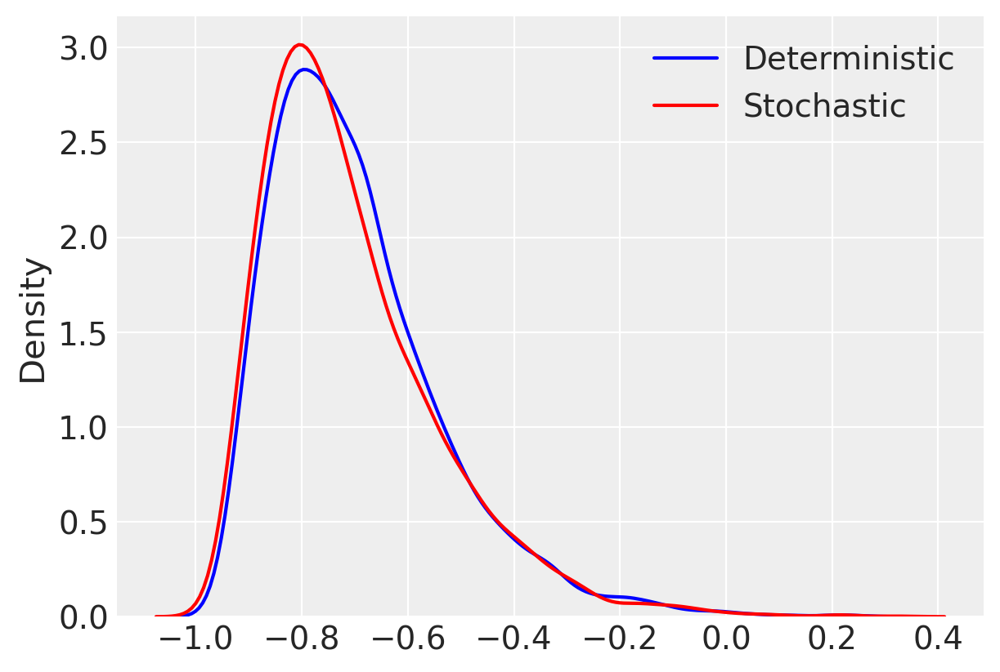

In [81]:
plt.figure(figsize=(6,4))
post_r_1 = trace1.posterior["r"]
post_r_2 = trace2.posterior["r"]
sns.kdeplot(post_r_1.to_numpy().flatten(), label="Deterministic", c="blue")
sns.kdeplot(post_r_2.to_numpy().flatten(), label="Stochastic", c="red")
plt.legend()

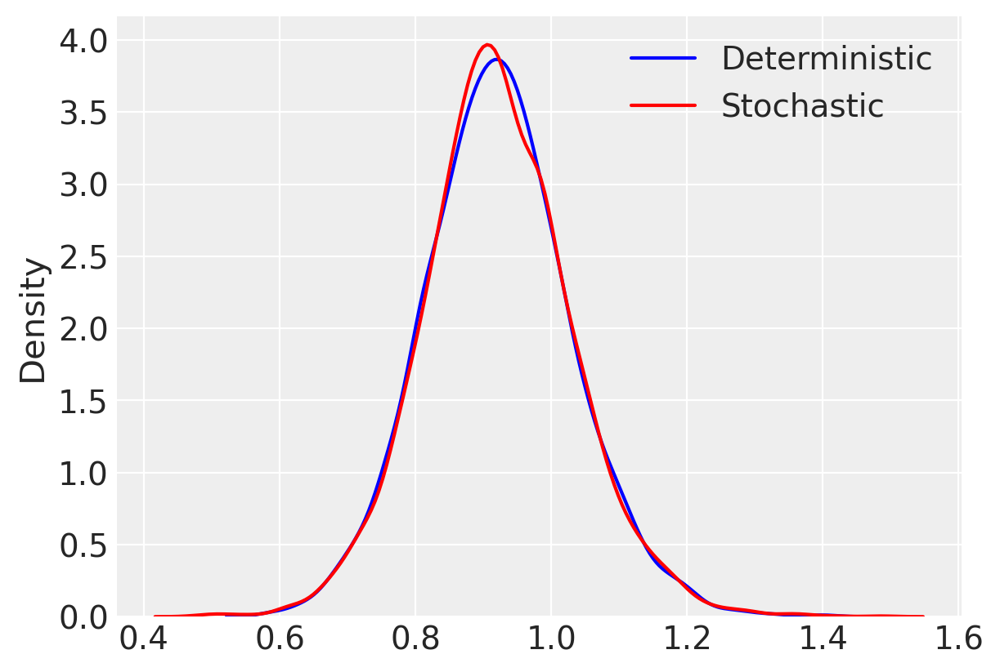

In [94]:
post_mu1_1 = trace1.posterior["mu"][:, :, 0]
post_mu1_2 = trace2.posterior["mu"][:, :, 0]
plt.figure(figsize=(6,4))
sns.kdeplot(post_mu1_1.to_numpy().flatten(), label="Deterministic", c="blue")
sns.kdeplot(post_mu1_2.to_numpy().flatten(), label="Stochastic", c="red")
plt.legend()

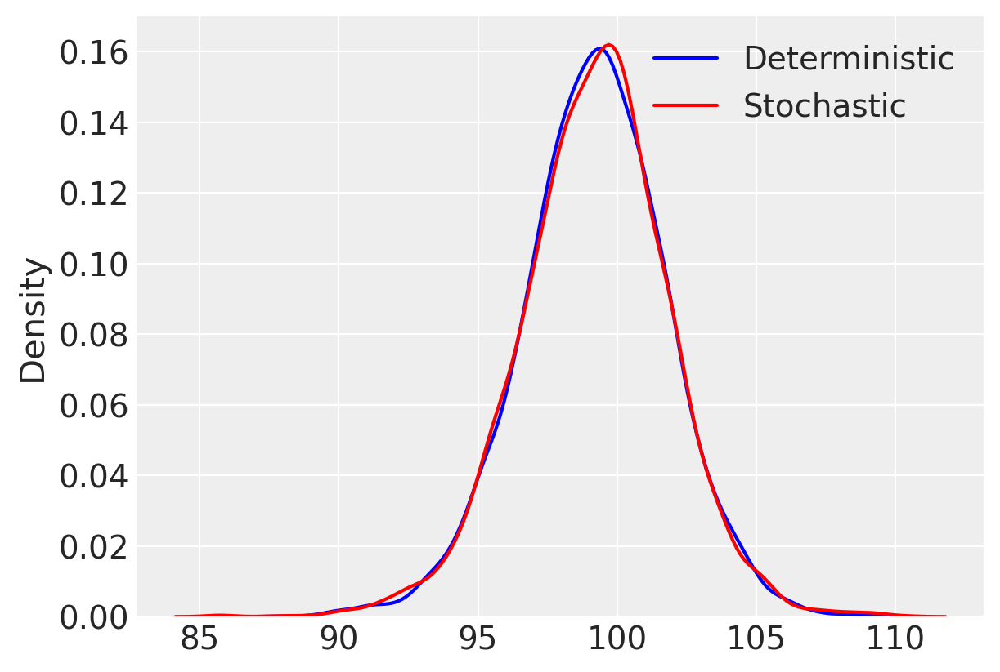

In [95]:
post_mu2_1 = trace1.posterior["mu"][:, :, 1]
post_mu2_2 = trace2.posterior["mu"][:, :, 1]
plt.figure(figsize=(6,4))
sns.kdeplot(post_mu2_1.to_numpy().flatten(), label="Deterministic", c="blue")
sns.kdeplot(post_mu2_2.to_numpy().flatten(), label="Stochastic", c="red")
plt.legend()

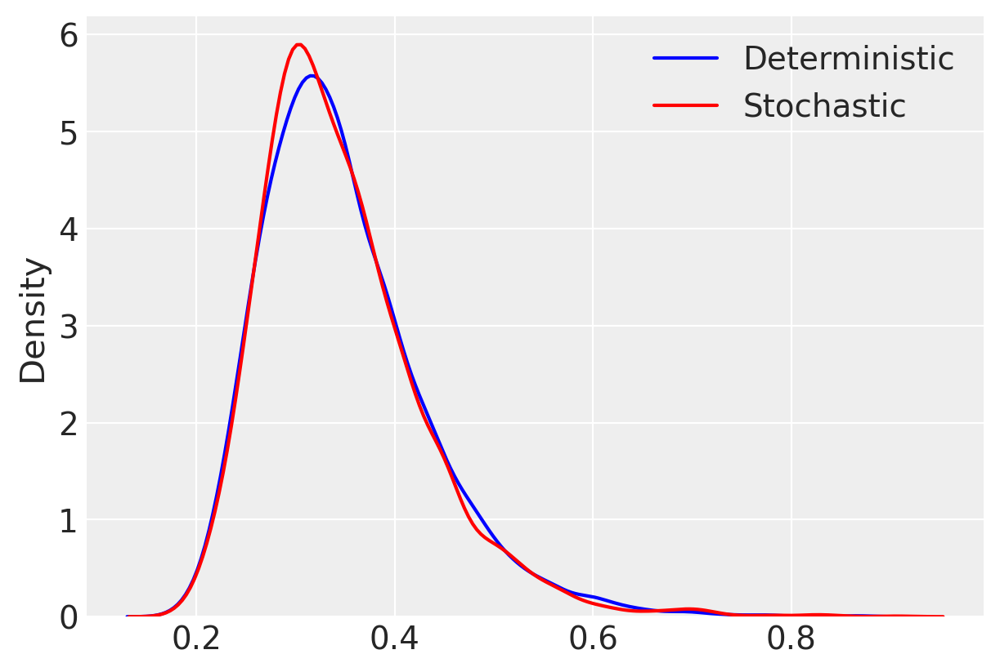

In [97]:
post_sigma1_1 = trace1.posterior["sigma1"]
post_sigma1_2 = trace2.posterior["sigma1"]
plt.figure(figsize=(6,4))
sns.kdeplot(post_sigma1_1.to_numpy().flatten(), label="Deterministic", c="blue")
sns.kdeplot(post_sigma1_2.to_numpy().flatten(), label="Stochastic", c="red")
plt.legend()

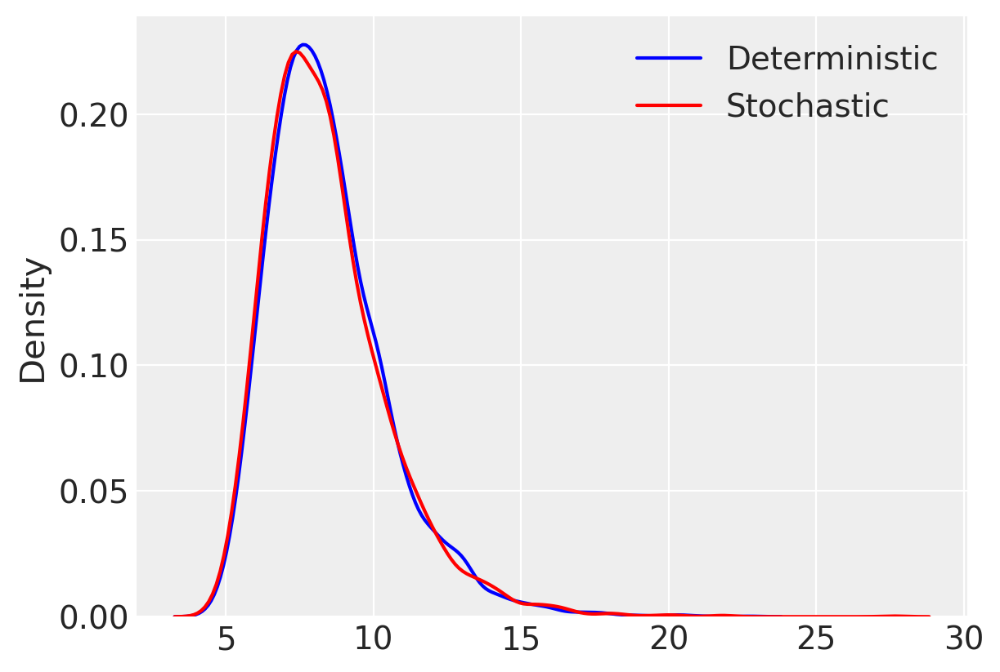

In [98]:
post_sigma2_1 = trace1.posterior["sigma2"]
post_sigma2_2 = trace2.posterior["sigma2"]
plt.figure(figsize=(6,4))
sns.kdeplot(post_sigma2_1.to_numpy().flatten(), label="Deterministic", c="blue")
sns.kdeplot(post_sigma2_2.to_numpy().flatten(), label="Stochastic", c="red")
plt.legend()

No other significant difference in posterior distribution.

#### Exercise 5.2.2

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [r, mu, lambda1, lambda2, yd]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 537 seconds.
There were 498 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


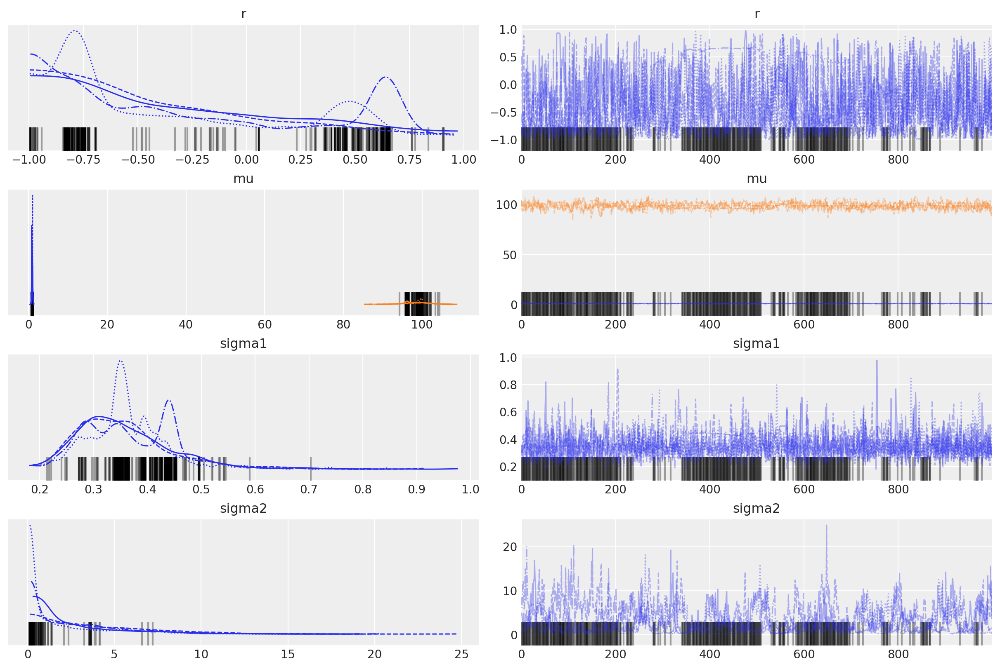

In [102]:
# The datasets:
y = np.array(
    [
        0.8, 102,
        1, 98,
        0.5, 100,
        0.9, 105,
        0.7, 103,
        0.4, 110,
        1.2, 99,
        1.4, 87,
        0.6, 113,
        1.1, 89,
        1.3, 93,
    ]
).reshape((11, 2))

n1, n2 = np.shape(y)
sigmaerror = np.array([0.03, 10])
se = np.tile(sigmaerror, (n1, 1))

with pm.Model() as model2_2:
    #  r∼Uniform(−1,1)
    r = pm.Uniform("r", lower=-1, upper=1)

    # μ1,μ2∼Gaussian(0,.001)
    mu = pm.Normal("mu", mu=0, tau=0.001, shape=n2)

    # σ1,σ2∼InvSqrtGamma(.001,.001)
    lambda1 = pm.Gamma("lambda1", alpha=0.001, beta=0.001)
    lambda2 = pm.Gamma("lambda2", alpha=0.001, beta=0.001)
    sigma1 = pm.Deterministic("sigma1", 1 / np.sqrt(lambda1))
    sigma2 = pm.Deterministic("sigma2", 1 / np.sqrt(lambda2))

    cov = pm.Deterministic(
        "cov",
        tt.stacklists(
            [[lambda1 ** -1, r * sigma1 * sigma2], [r * sigma1 * sigma2, lambda2 ** -1]]
        ),
    )

    # xi∼MvGaussian((μ1,μ2),[σ1^2,rσ1σ2;rσ1σ2,σ2^2]^−1)
    yd = pm.MvNormal("yd", mu=mu, cov=cov, shape=(n1, n2))

    xi = pm.Normal("xi", mu=yd, sigma=sigmaerror, observed=y)

    trace2_2 = pm.sample(tune=2000, target_accept=.9)
    
az.plot_trace(trace2_2, var_names=["r", "mu", "sigma1", "sigma2"]);

In [103]:
az.summary(trace2_2, 
           var_names=["r", "mu", "sigma1", "sigma2"],
           stat_funcs={"median": np.median})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
r,-0.338,0.540,-0.981,0.659,0.070,0.050,85.0,403.0,1.04,-0.508
mu[0],0.903,0.106,0.714,1.091,0.009,0.006,153.0,1767.0,1.02,0.903
mu[1],98.710,2.967,92.977,104.326,0.112,0.079,688.0,1391.0,1.03,98.870
sigma1,0.361,0.088,0.222,0.521,0.004,0.003,384.0,1713.0,1.04,0.350
sigma2,2.904,3.030,0.121,8.508,0.305,0.216,41.0,39.0,1.08,1.779


sd of $r$, $\mu[1]$, $\sigma2$ are larger (because we allow more uncertainty in the second dimension).

absolute value of $r$ is smaller (because we allow more uncertainty in the second dimension).

#### Exercise 5.2.3

Model the uncertainty as a parameter. The prior can be a uniform distribution between \<lowest possible value\> to \<highest possible value\>.

Solution for Reference:
> Whether the current data would be informative enough about the uncertainty of measurement to allow helpful inference is less clear. It might be that diﬀerent sorts of data, like repeated measurements of the same people’s IQs, are needed for this model to be eﬀective.

#### Exercise 5.2.4

Model $\sigma_2$ as a function of $\mu_2$.

## 5.3 The kappa coefficient of agreement
  
A measurement to decide how well one decision-making method agrees with another.
For this problem, when both decision-making methods make n independent assessments, the data y take the form of four counts: a observations where both methods decide “one,” b observations where the objective method decides “one” but the surrogate method decides “zero,” c observations where the objective method decides “zero” but the surrogate method decides “one,” and d observations where both methods decide “zero,” with n = a + b + c + d.

$$ \kappa = (\xi-\psi)/(1-\psi)  $$
$$ \xi = \alpha\beta + (1-\alpha) \gamma  $$
$$ \psi = (\pi_{a}+\pi_{b})(\pi_{a}+\pi_{c})+(\pi_{b}+\pi_{d})(\pi_{c}+\pi_{d})  $$
$$ \alpha,\beta,\gamma \sim \text{Beta} (1, 1) $$  
$$ \pi_{a} = \alpha\beta  $$ 
$$ \pi_{b} = \alpha(1-\beta)  $$  
$$ \pi_{c} = (1-\alpha)(1-\gamma)  $$  
$$ \pi_{d} = (1-\alpha)\gamma  $$  
$$ y \sim \text{Multinomial} ([\pi_{a},\pi_{b},\pi_{c},\pi_{d}],n)  $$

In [7]:
# CHOOSE a data set:
# Influenza
y = np.array([14, 4, 5, 210])
# Hearing Loss
# y = np.array([20, 7, 103, 417])
# Rare Disease
# y = np.array([0, 0, 13, 157])

with pm.Model() as model3:
    # prior
    alpha = pm.Beta("alpha", alpha=1, beta=1)
    beta = pm.Beta("beta", alpha=1, beta=1)
    gamma = pm.Beta("gamma", alpha=1, beta=1)

    pi1 = alpha * beta
    pi2 = alpha * (1 - beta)
    pi3 = (1 - alpha) * (1 - gamma)
    pi4 = (1 - alpha) * gamma

    # Derived Measures
    # Rate Surrogate Method Agrees With the Objective Method
    # xi = alpha * beta + (1 - alpha) * gamma
    xi = pm.Deterministic("xi", alpha * beta + (1 - alpha) * gamma)

    yd = pm.Multinomial("yd", n=y.sum(), p=[pi1, pi2, pi3, pi4], observed=y)

    # Rate of Chance Agreement
    psi = pm.Deterministic("psi", (pi1 + pi2) * (pi1 + pi3) + (pi2 + pi4) * (pi3 + pi4))

    # Chance-Corrected Agreement
    kappa = pm.Deterministic("kappa", (xi - psi) / (1 - psi))

    trace3 = pm.sample(tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta, gamma]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 31 seconds.


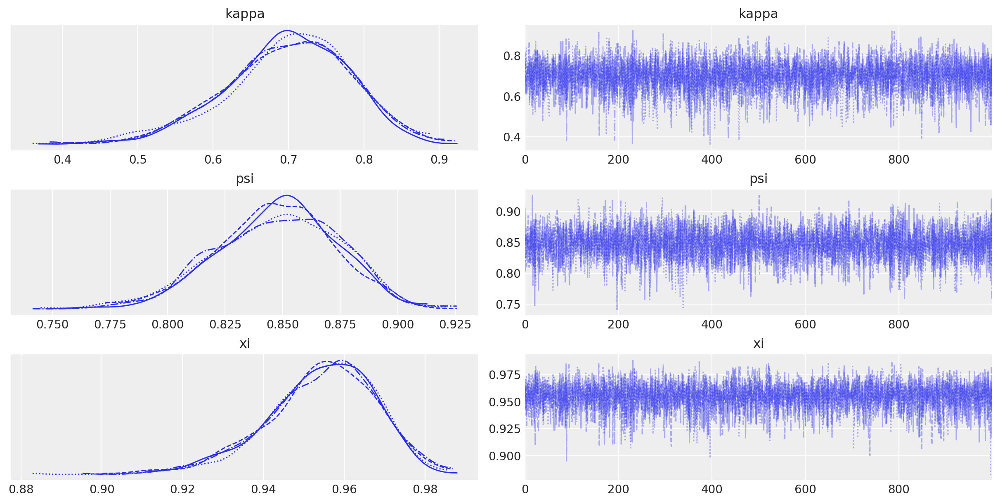

In [8]:
az.plot_trace(trace3, var_names=["kappa", "psi", "xi"]);

In [16]:
az.summary(trace3,
           var_names=["kappa", "psi", "xi"],
           stat_funcs={"median": np.median})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
kappa,0.698,0.083,0.531,0.840,0.001,0.001,5690.0,2971.0,1.0,0.704
psi,0.847,0.027,0.799,0.896,0.000,0.000,5009.0,2691.0,1.0,0.849
xi,0.954,0.013,0.927,0.977,0.000,0.000,5419.0,2681.0,1.0,0.956


Cohen's point estimate: 0.736
MCMC estimate: 0.698


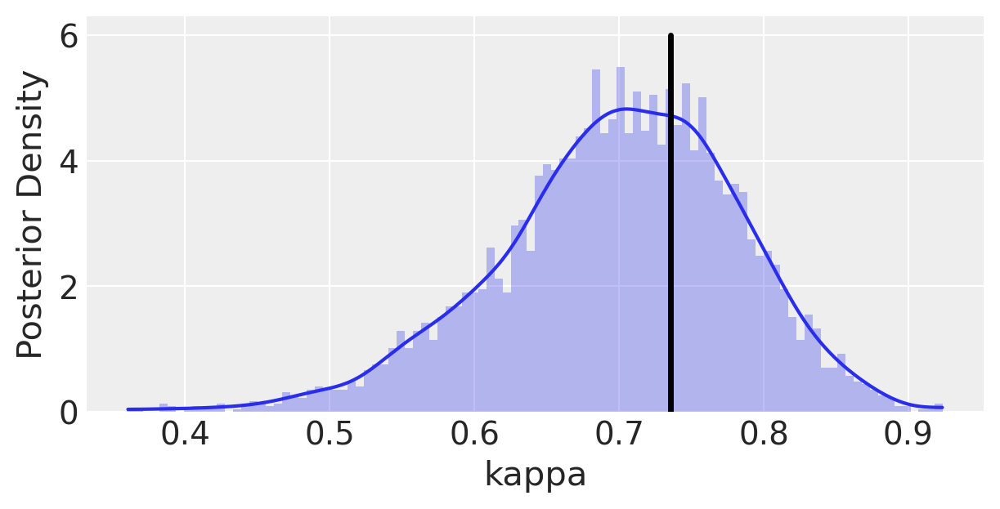

In [10]:
# Compare to Cohen's point estimate
n = y.sum()
p0 = (y[0] + y[3]) / n
pe = (((y[0] + y[1]) * (y[0] + y[2])) + ((y[1] + y[3]) * (y[2] + y[3]))) / n ** 2
kappa_Cohen = (p0 - pe) / (1 - pe)

kappa = trace3.posterior["kappa"]

_, axes = plt.subplots(1, 1, figsize=(6, 3))
az.plot_kde(kappa.to_numpy().flatten(), ax=axes)
axes.hist(kappa.to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes.plot([kappa_Cohen, kappa_Cohen], [0, 6], "k", lw=2.5)
axes.set_xlabel("kappa")
axes.set_ylabel("Posterior Density")

print("Cohen's point estimate: %.3f" % kappa_Cohen)
print("MCMC estimate: %.3f" % np.mean(kappa))

### Exercises

#### Exercise 5.3.1

MCMC estimation of $\kappa$ is 0.698, which is "fair to good".

$\beta$ mean is 0.751, and $\gamma$ mean is 0.972. So the surrogate method is more likely make false negative mistakes. 

> Solution for Reference:
>
> The surrogate method does a better job detecting the absence of inﬂuenza than it does detecting the presence of inﬂuenza.

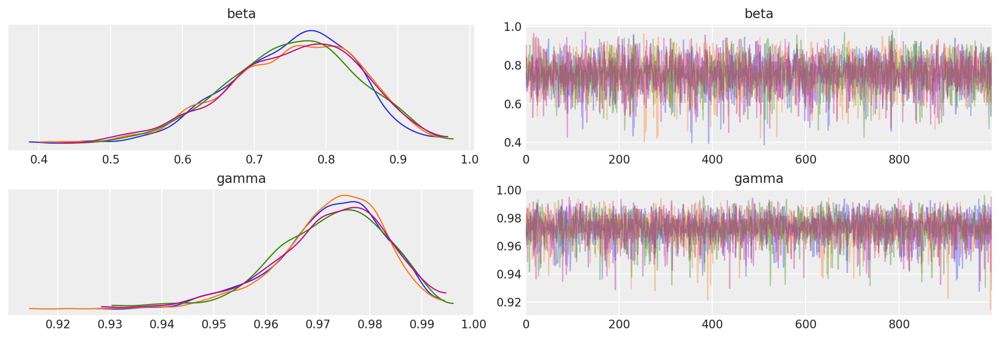

In [13]:
az.plot_trace(trace3, var_names=["beta", "gamma"], compact=False);

In [19]:
az.summary(trace3, var_names=["alpha", "beta", "gamma"], stat_funcs={"median": np.median})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
alpha,0.081,0.017,0.050,0.113,0.000,0.000,4958.0,2950.0,1.0,0.080
beta,0.751,0.094,0.586,0.924,0.001,0.001,5298.0,2561.0,1.0,0.760
gamma,0.972,0.011,0.952,0.991,0.000,0.000,5400.0,2877.0,1.0,0.974


    What if we want to know "when the surrogate method says 'one', how likely is it that the objective method will also say 'one'?"
    
    => Model the problem in another way

In [17]:
# CHOOSE a data set:
# Influenza
y = np.array([14, 4, 5, 210])

with pm.Model() as model3_1:
    # prior
    alpha = pm.Beta("alpha", alpha=1, beta=1) # the rate at which the surrogate method says 'one'
    beta = pm.Beta("beta", alpha=1, beta=1) # the rate at which, when the surrogate method says 'one', the objective method says 'one'
    gamma = pm.Beta("gamma", alpha=1, beta=1) # the rate at which, when the surrogate method says 'zero', the objective method says 'zero'

    pi1 = alpha * beta
    # pi2 = alpha * (1 - beta)
    pi2 = (1 - alpha) * (1 - gamma)
    # pi3 = (1 - alpha) * (1 - gamma)
    pi3 = alpha * (1 - beta)
    pi4 = (1 - alpha) * gamma

    # Derived Measures
    # Rate Surrogate Method Agrees With the Objective Method
    # xi = alpha * beta + (1 - alpha) * gamma
    xi = pm.Deterministic("xi", alpha * beta + (1 - alpha) * gamma)

    yd = pm.Multinomial("yd", n=y.sum(), p=[pi1, pi2, pi3, pi4], observed=y)

    # Rate of Chance Agreement
    psi = pm.Deterministic("psi", (pi1 + pi2) * (pi1 + pi3) + (pi2 + pi4) * (pi3 + pi4))

    # Chance-Corrected Agreement
    kappa = pm.Deterministic("kappa", (xi - psi) / (1 - psi))

    trace3_1 = pm.sample(tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta, gamma]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 31 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
kappa,0.698,0.084,0.541,0.849,0.001,0.001,4971.0,2584.0,1.0,0.704
beta,0.714,0.095,0.537,0.891,0.001,0.001,5139.0,3121.0,1.0,0.721
gamma,0.977,0.010,0.959,0.994,0.000,0.000,4442.0,2562.0,1.0,0.978


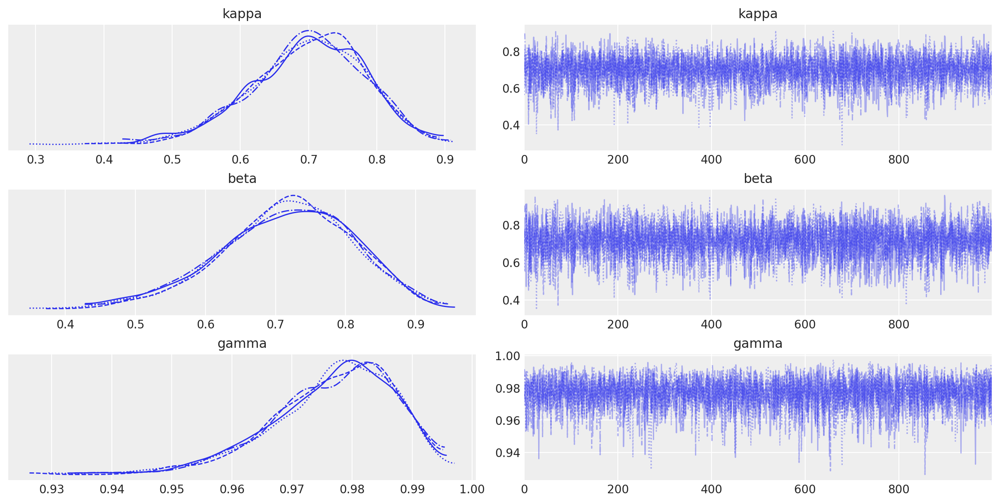

In [18]:
az.plot_trace(trace3_1, var_names=["kappa", "beta", "gamma"]);

az.summary(trace3_1,
              var_names=["kappa", "beta", "gamma"],
              stat_funcs={"median": np.median})

So based on this model: 

1. MCMC estimation of $\kappa$ is 0.698, same as the previous model.

2. $\beta$ mean is 0.714 (so when the surrogate method says 'one', its correct rate is 0.714), and $\gamma$ mean is 0.977 (so when the surrogate method says 'zero', its correct rate is 0.977).

In [21]:
# and we try to compute the above estimates from trace 1:
a = 0.081 # std 1
b = 0.751 # surr 1 when std 1
g = 0.972 # surr 0 when std 0
print(a * b / (a * b + (1 - a) * (1 - g)))
print((1-a) * g / ((1-a) * g + a * (1-b)))

0.7027367350946707
0.9779196594839054


They are approximately the same.

#### Exercise 5.3.2

In [23]:
# CHOOSE a data set:
# Hearing Loss
y = np.array([20, 7, 103, 417])
# Rare Disease
# y = np.array([0, 0, 13, 157])

with pm.Model() as model3_2:
    # prior
    alpha = pm.Beta("alpha", alpha=1, beta=1)
    beta = pm.Beta("beta", alpha=1, beta=1)
    gamma = pm.Beta("gamma", alpha=1, beta=1)

    pi1 = alpha * beta
    pi2 = alpha * (1 - beta)
    pi3 = (1 - alpha) * (1 - gamma)
    pi4 = (1 - alpha) * gamma

    # Derived Measures
    # Rate Surrogate Method Agrees With the Objective Method
    # xi = alpha * beta + (1 - alpha) * gamma
    xi = pm.Deterministic("xi", alpha * beta + (1 - alpha) * gamma)

    yd = pm.Multinomial("yd", n=y.sum(), p=[pi1, pi2, pi3, pi4], observed=y)

    # Rate of Chance Agreement
    psi = pm.Deterministic("psi", (pi1 + pi2) * (pi1 + pi3) + (pi2 + pi4) * (pi3 + pi4))

    # Chance-Corrected Agreement
    kappa = pm.Deterministic("kappa", (xi - psi) / (1 - psi))

    trace3_2 = pm.sample(tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta, gamma]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 33 seconds.


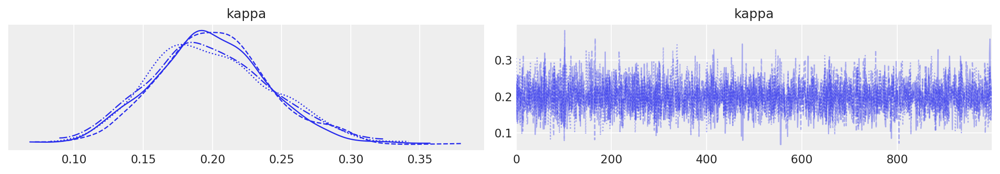

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
kappa,0.199,0.043,0.119,0.280,0.001,0.000,6022.0,3025.0,1.01,0.197
alpha,0.051,0.009,0.033,0.067,0.000,0.000,6209.0,2820.0,1.00,0.050
beta,0.724,0.082,0.574,0.882,0.001,0.001,6290.0,2915.0,1.00,0.729
gamma,0.801,0.018,0.768,0.835,0.000,0.000,5802.0,3192.0,1.00,0.801


In [24]:
az.plot_trace(trace3_2, var_names=["kappa"]);
plt.show()

az.summary(trace3_2,
                var_names=["kappa", "alpha", "beta", "gamma"],
                stat_funcs={"median": np.median})

Cohen's point estimate: 0.202
MCMC estimate: 0.199


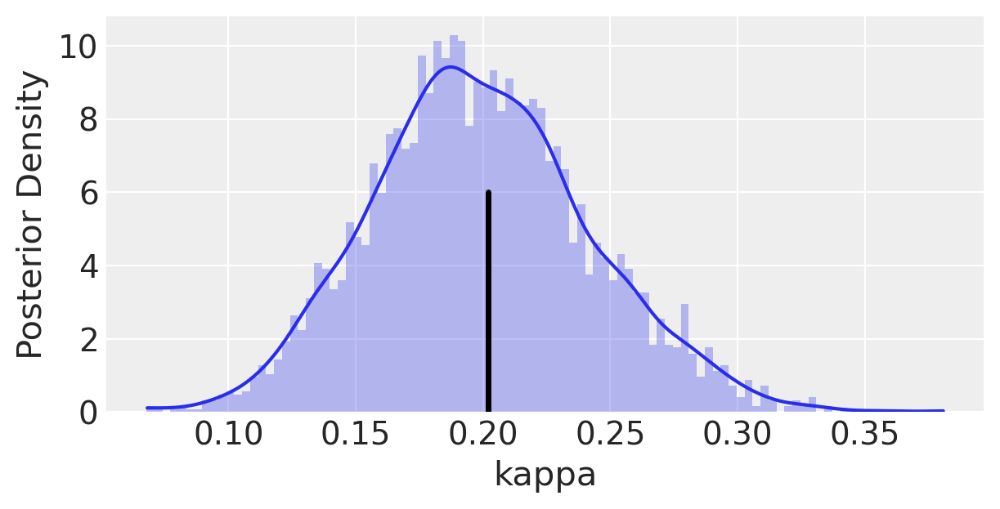

In [25]:
# Compare to Cohen's point estimate
n = y.sum()
p0 = (y[0] + y[3]) / n
pe = (((y[0] + y[1]) * (y[0] + y[2])) + ((y[1] + y[3]) * (y[2] + y[3]))) / n ** 2
kappa_Cohen = (p0 - pe) / (1 - pe)

kappa = trace3_2.posterior["kappa"]

_, axes = plt.subplots(1, 1, figsize=(6, 3))
az.plot_kde(kappa.to_numpy().flatten(), ax=axes)
axes.hist(kappa.to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes.plot([kappa_Cohen, kappa_Cohen], [0, 6], "k", lw=2.5)
axes.set_xlabel("kappa")
axes.set_ylabel("Posterior Density")

print("Cohen's point estimate: %.3f" % kappa_Cohen)
print("MCMC estimate: %.3f" % np.mean(kappa))

MCMC estimation of $\kappa$ is 0.199, so very poor agreement.

#### Exercise 5.3.3

In [26]:
# CHOOSE a data set:
# Rare Disease
y = np.array([0, 0, 13, 157])

with pm.Model() as model3_3:
    # prior
    alpha = pm.Beta("alpha", alpha=1, beta=1)
    beta = pm.Beta("beta", alpha=1, beta=1)
    gamma = pm.Beta("gamma", alpha=1, beta=1)

    pi1 = alpha * beta
    pi2 = alpha * (1 - beta)
    pi3 = (1 - alpha) * (1 - gamma)
    pi4 = (1 - alpha) * gamma

    # Derived Measures
    # Rate Surrogate Method Agrees With the Objective Method
    # xi = alpha * beta + (1 - alpha) * gamma
    xi = pm.Deterministic("xi", alpha * beta + (1 - alpha) * gamma)

    yd = pm.Multinomial("yd", n=y.sum(), p=[pi1, pi2, pi3, pi4], observed=y)

    # Rate of Chance Agreement
    psi = pm.Deterministic("psi", (pi1 + pi2) * (pi1 + pi3) + (pi2 + pi4) * (pi3 + pi4))

    # Chance-Corrected Agreement
    kappa = pm.Deterministic("kappa", (xi - psi) / (1 - psi))

    trace3_3 = pm.sample(tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta, gamma]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 33 seconds.


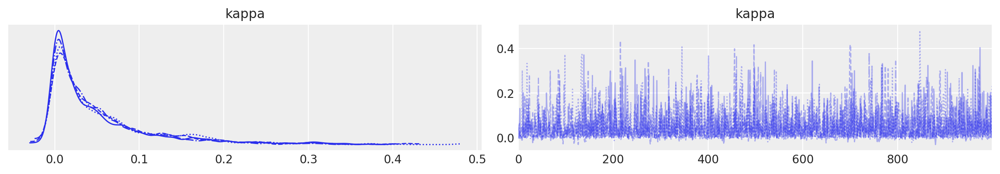

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
kappa,0.053,0.067,-0.012,0.185,0.001,0.001,2799.0,2296.0,1.0,0.028
alpha,0.006,0.006,0.000,0.016,0.000,0.000,2930.0,2043.0,1.0,0.004
beta,0.498,0.289,0.002,0.936,0.004,0.003,3616.0,2290.0,1.0,0.501
gamma,0.919,0.021,0.880,0.958,0.000,0.000,2903.0,1877.0,1.0,0.920


In [28]:
az.plot_trace(trace3_3, var_names=["kappa"]);
plt.show()

az.summary(trace3_3,
                var_names=["kappa", "alpha", "beta", "gamma"],
                stat_funcs={"median": np.median})

Cohen's point estimate: 0.000
MCMC estimate: 0.053


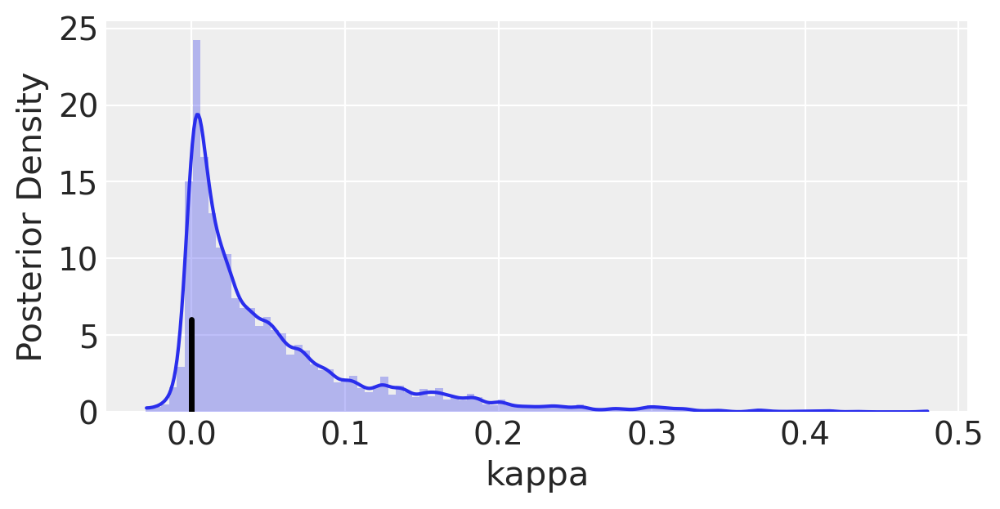

In [29]:
# Compare to Cohen's point estimate
n = y.sum()
p0 = (y[0] + y[3]) / n
pe = (((y[0] + y[1]) * (y[0] + y[2])) + ((y[1] + y[3]) * (y[2] + y[3]))) / n ** 2
kappa_Cohen = (p0 - pe) / (1 - pe)

kappa = trace3_3.posterior["kappa"]

_, axes = plt.subplots(1, 1, figsize=(6, 3))
az.plot_kde(kappa.to_numpy().flatten(), ax=axes)
axes.hist(kappa.to_numpy().flatten(), bins=100, density=1, alpha=0.3)
axes.plot([kappa_Cohen, kappa_Cohen], [0, 6], "k", lw=2.5)
axes.set_xlabel("kappa")
axes.set_ylabel("Posterior Density")

print("Cohen's point estimate: %.3f" % kappa_Cohen)
print("MCMC estimate: %.3f" % np.mean(kappa))

> Solution for Reference:
>
> This poses a challenge for frequentist estimators. In order to deal with the problem of zero counts a frequentist may add a “1” to each cell in the design, but this amounts to fabricating data. An attractive property of the Bayesian approach is that it is always possible to do the analysis.

## 5.4 Change detection in time series data
  
Detecting a single change point in time series.

$$ \mu_{1},\mu_{2} \sim \text{Gaussian}(0, .001)  $$
$$ \lambda \sim \text{Gamma} (.001, .001)  $$
$$ \tau \sim \text{Uniform} (0, t_{max}) $$  
$$   c_{i} \sim
\begin{cases}
\text{Gaussian}(\mu_{1}, \lambda),  & \text{if $t_{i} \lt \tau$} \\
\text{Gaussian}(\mu_{2}, \lambda),  & \text{if $t_{i} \ge \tau$}
\end{cases}  $$

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [lambd, mu]
>Metropolis: [tau]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 12 seconds.
The number of effective samples is smaller than 25% for some parameters.


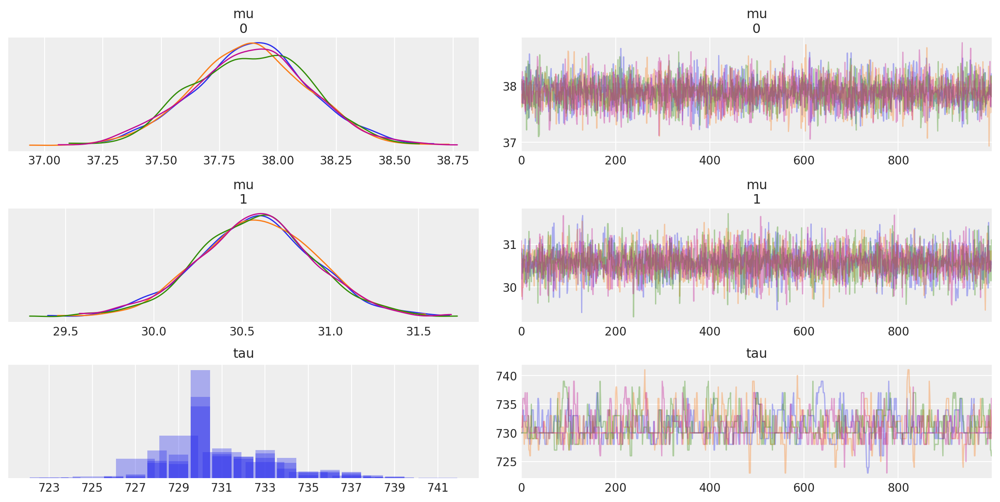

In [9]:
# Load data
dat = pd.read_csv("changepointdata.csv")

c = dat.data
n = np.size(c)
sample = np.arange(0, n)

with pm.Model() as model4:
    # μ1,μ2∼Gaussian(0,.001)
    mu = pm.Normal("mu", mu=0, tau=0.001, shape=2)
    # λ∼Gamma(.001,.001)
    lambd = pm.Gamma("lambd", alpha=0.001, beta=0.001)
    # 　τ∼Uniform(0,tmax)
    tau = pm.DiscreteUniform("tau", lower=0, upper=n)

    muvect = pm.math.switch(tau >= sample, mu[0], mu[1])
    cobs = pm.Normal("cobs", mu=muvect, tau=lambd, observed=c)

    trace4 = pm.sample(tune=2000)

g = az.plot_trace(trace4, var_names=["mu", "tau"])
g[2, 0].set_xticks(np.arange(723, 742, 2));  # Avoid overlap of xticks in tau histogram

In [10]:
az.summary(trace4)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
mu[0],37.885,0.250,37.405,38.341,0.004,0.002,5120.0,5120.0,5131.0,2875.0,1.00
mu[1],30.577,0.332,29.914,31.180,0.005,0.003,5340.0,5339.0,5358.0,2531.0,1.00
tau,731.004,2.446,728.000,736.000,0.095,0.067,662.0,661.0,711.0,851.0,1.01
lambd,0.021,0.001,0.020,0.023,0.000,0.000,4719.0,4682.0,4752.0,2995.0,1.00


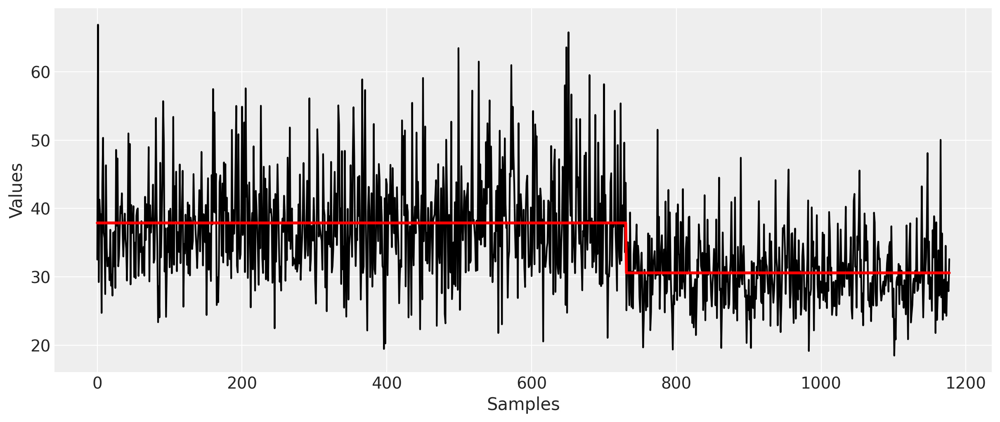

In [11]:
MCtau = trace4["tau"]
MCmu = trace4["mu"]

mu1 = np.mean(MCmu, axis=0)
tau1 = int(np.mean(MCtau))
fited = np.zeros(n)
fited[:tau1] = np.ones(tau1) * mu1[0]
fited[tau1:] = np.ones(n - tau1) * mu1[1]

_, axes = plt.subplots(1, 1, figsize=(12, 5))
axes.plot(np.arange(0, n, 1), c, color="k")
axes.plot(np.arange(0, n, 1), fited, color="r", lw=2.5)
axes.set_xlabel("Samples")
axes.set_ylabel("Values");

## 5.5 Censored data

After 949 failed attempts, Cha Sa-Soon from Korea finally passed her theoretical drivers exam. What can we infer about theta, the probability of answering any one question correctly?

$$ \theta \sim \text{Uniform}(0.25, 1) $$
$$ z_{i} \sim \text{Binomial}(\theta, n) $$
$$ 15 \le z_{i} \le 25, \text{if} \; y_{i} = 1 $$ 


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [theta]


Sampling 4 chains for 3_000 tune and 3_000 draw iterations (12_000 + 12_000 draws total) took 12 seconds.


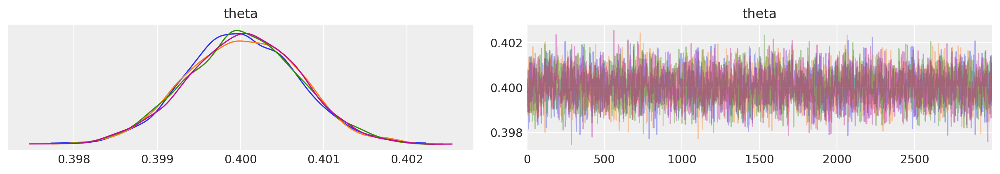

In [12]:
n = 50  # Number of questions
nfails = 949
unobsmin = 15
unobsmax = 25
unobsrange = np.arange(unobsmin, unobsmax + 1)
z = 30

def CensorLike(n, p, unobsrange, nfails):
    # The log likelihood of the unobserved zs is given by the
    # log CDF of the Binomial distribution within the unobsrange 
    # multiplied by the number of failures
    binom = pm.Binomial.dist(n=n, p=p)
    return binom.logp(unobsrange).sum() * nfails        

with pm.Model() as model5:
    theta = pm.Uniform("theta", lower=0.25, upper=1)

    unobs = pm.Potential("unobs", CensorLike(n, theta, unobsrange, nfails))
    obs = pm.Binomial("obs", n=n, p=theta, observed=z)
    
    trace5 = pm.sample(3000, tune=3000)

az.plot_trace(trace5);

## 5.6 Recapturing planes

$$ k \sim \text{Hypergeometric}(n, x, t) $$ 
$$ t  \sim \text{Categorical}(\alpha) $$ 

In [13]:
x = 10  # number of captures
k = 4  # number of recaptures from n
n = 5  # size of second sample
tmax = 50  # maximum population size

betaln = pm.distributions.dist_math.betaln

def HyperGeometric(N, k, n):
    def logp(value):
        # Log likelihood of the HyperGeometric distribution
        tot, good = N, k
        bad = tot - good
        result = (
            betaln(good + 1, 1)
            + betaln(bad + 1, 1)
            + betaln(tot - n + 1, n + 1)
            - betaln(value + 1, good - value + 1)
            - betaln(n - value + 1, bad - n + value + 1)
            - betaln(tot + 1, 1)
        )
        return result
    return logp

with pm.Model() as model7:
    tau = pm.DiscreteUniform("tau", lower=x + (n - k), upper=tmax)
    obs = pm.DensityDist("obs", HyperGeometric(tau, x, n), observed=k)
    trace7 = pm.sample()

Multiprocess sampling (4 chains in 4 jobs)
Metropolis: [tau]


In [14]:
# # Code for the zeros-trick with the Poisson distribution

# factln = pm.distributions.dist_math.factln

# with pm.Model() as model7:
#     tau = pm.DiscreteUniform("tau", lower=x + (n - k), upper=tmax)
#     logterm1 = factln(x + 0.01) - factln(k + 0.01) - factln(x - k + 0.01)
#     logterm2 = (
#         factln(tau - x + 0.01)
#         - factln(n - k + 0.01)
#         - factln((tau - x) - (n - k) + 0.01)
#     )
#     logterm3 = factln(tau + 0.01) - factln(n + 0.01) - factln(tau - n + 0.01)
#     C = 1000
#     phi = -(logterm1 + logterm2 - logterm3) + C

#     obs = pm.Poisson("obs", mu=phi, observed=0)
#     trace7 = pm.sample()

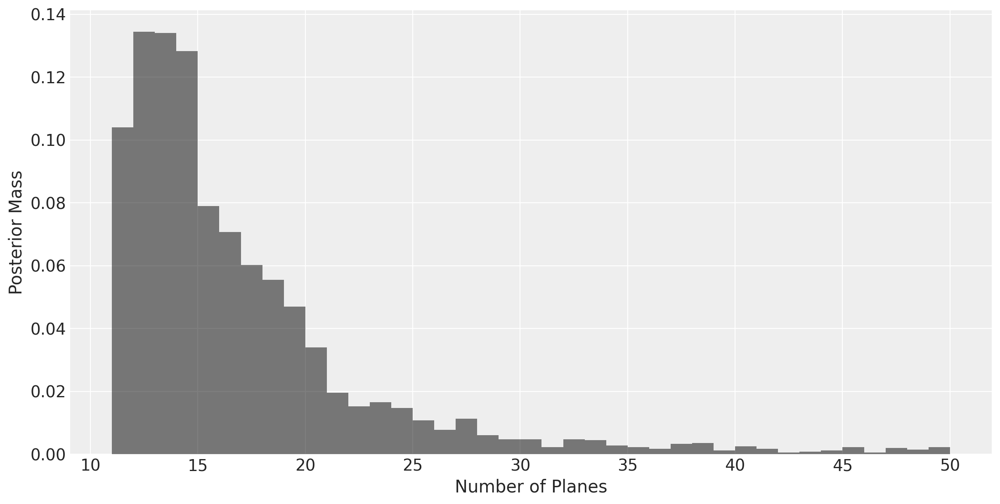

In [15]:
tau = trace7["tau"]

plt.figure(figsize=(12, 6))
plt.hist(tau, bins=tmax - (x + (n - k)), density=1, alpha=0.5, color="k")
plt.xlabel("Number of Planes")
plt.ylabel("Posterior Mass");

In [16]:
%load_ext watermark
%watermark -n -u -v -iv -w

arviz  0.10.0
pymc  3.9.2
pandas 1.0.3
numpy  1.18.2
last updated: Sun Nov 15 2020 

CPython 3.8.5
IPython 7.13.0
watermark 2.0.2
